* Master DAC, BDLE, 2021 
* Author: Mohamed-Amine Baazizi
* Affiliation: LIP6 - Faculté des Sciences - Sorbonne Université
* Email: mohamed-amine.baazizi@lip6.fr


<font size = 5>**Jianying LIU 21114628<br>Haoran LI 28705184** </font>

# Decision Tree in Spark ML

### **données choisies : prix de logements**


## Préparation

Vérifier que des ressources de calcul sont allouées à votre notebook est connecté (cf RAM  de disque indiqués en haut à droite) . Sinon cliquer sur le bouton connecter pour obtenir des ressources.




Pour accéder directement aux fichiers stockées sur votre google drive. Renseigner le code d'authentification lorsqu'il est demandé

Ajuster le nom de votre dossier : MyDrive/bdle/dir. **Remplacer dir **

In [ ]:
import os
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

drive_dir = "/content/drive/MyDrive/bdle/DM2/"
os.makedirs(drive_dir, exist_ok=True)

Mounted at /content/drive


Télécharger les données : https://www.kaggle.com/austinreese/usa-housing-listings  

Ajouter directement les données `housing.csv` dans le chemin **drive_dir**


In [ ]:
os.listdir(drive_dir)

['housing.csv', 'sample_libsvm_data.txt', 'housing2.csv']

Installer pyspark et findspark :


In [ ]:
!pip install -q pyspark
!pip install -q findspark

     |████████████████████████████████| 281.3 MB 36 kB/s 
     |████████████████████████████████| 198 kB 14.0 MB/s 


Démarrer la session spark

In [ ]:
import os
# !find /usr/local -name "pyspark"
os.environ["SPARK_HOME"] = "/usr/local/lib/python3.7/dist-packages/pyspark"
os.environ["JAVA_HOME"] = "/usr"

In [ ]:
# Principaux import
import findspark
from pyspark.sql import SparkSession 
from pyspark import SparkConf  

# pour les dataframe et udf
from pyspark.sql import *  
from pyspark.sql.functions import *
from pyspark.sql.types import *
from datetime import *

# pour le chronomètre
import time

# initialise les variables d'environnement pour spark
findspark.init()

# Démarrage session spark 
# --------------------------
def demarrer_spark():
  local = "local[*]"
  appName = "TP"
  configLocale = SparkConf().setAppName(appName).setMaster(local).\
  set("spark.executor.memory", "6G").\
  set("spark.driver.memory","6G").\
  set("spark.sql.catalogImplementation","in-memory")
  
  spark = SparkSession.builder.config(conf = configLocale).getOrCreate()
  sc = spark.sparkContext
  sc.setLogLevel("ERROR")
  
  spark.conf.set("spark.sql.autoBroadcastJoinThreshold","-1")

  # On ajuste l'environnement d'exécution des requêtes à la taille du cluster (4 coeurs)
  spark.conf.set("spark.sql.shuffle.partitions","4")    
  print("session démarrée, son id est ", sc.applicationId)
  return spark
spark = demarrer_spark()

session démarrée, son id est  local-1636462595540


In [ ]:
# on utilise 8 partitions au lieu de 200 par défaut
spark.conf.set("spark.sql.shuffle.partitions", "8")
print("Nombre de partitions utilisées : ", spark.conf.get("spark.sql.shuffle.partitions"))

Nombre de partitions utilisées :  8


## Data loading  

**Remarque** : puisque les valeurs du champ **`description`** sont des textes qui contiennent les virgules, elles sont mises entre les `"`, donc il faut ajouter `option("quote", "\"")`; de plus, dans le texte on utilise `""` pour la citation, donc changer le caractère d’échappement à `"` par `option("escape", "\"")`

In [ ]:
# load
data = spark.read\
          .format('csv').option("header", "true")\
          .option("inferSchema", "true")\
          .option("quote", "\"")\
          .option("escape", "\"")\
          .load(drive_dir + "housing.csv")
data.printSchema()

root
 |-- id: string (nullable = true)
 |-- url: string (nullable = true)
 |-- region: string (nullable = true)
 |-- region_url: string (nullable = true)
 |-- price: string (nullable = true)
 |-- type: string (nullable = true)
 |-- sqfeet: string (nullable = true)
 |-- beds: string (nullable = true)
 |-- baths: string (nullable = true)
 |-- cats_allowed: string (nullable = true)
 |-- dogs_allowed: string (nullable = true)
 |-- smoking_allowed: string (nullable = true)
 |-- wheelchair_access: string (nullable = true)
 |-- electric_vehicle_charge: integer (nullable = true)
 |-- comes_furnished: string (nullable = true)
 |-- laundry_options: string (nullable = true)
 |-- parking_options: string (nullable = true)
 |-- image_url: string (nullable = true)
 |-- description: string (nullable = true)
 |-- lat: double (nullable = true)
 |-- long: string (nullable = true)
 |-- state: string (nullable = true)



In [ ]:
data.select("description").show()
#les informations de "description" sont trop compliquées pour que nous les utilisions, c'est inexploitable

+--------------------+
|         description|
+--------------------+
|Ridgeview by Vint...|
|Conveniently loca...|
|2BD | 2BA | 1683S...|
|MOVE IN SPECIAL F...|
|Move In Today: Re...|
|1BD | 1BA | 720SQ...|
|Tucked away in a ...|
|MOVE IN SPECIAL F...|
|BRAND NEW APARTME...|
|6850 Sharlands Av...|
|In addition to at...|
|2741 Albazano Dri...|
|Welcome Home to Z...|
|Style, substance,...|
|Pre-leasing for 2...|
|200 Talus Way #22...|
|Ridgeview by Vint...|
|Inova14001 SUMMIT...|
|12001 Andes Stree...|
|3 YEAR NEW EXECUT...|
+--------------------+
only showing top 20 rows



Taux(pourcentage) de valeurs manquantes

In [ ]:
import pyspark.sql.functions as fn
data.agg(*[bround(100*(1-(fn.count(c) /fn.count('*'))), scale=5).alias(c+'_missing') for c in data.columns]).show()

+----------+-----------+--------------+------------------+-------------+------------+--------------+------------+-------------+--------------------+--------------------+-----------------------+-------------------------+-------------------------------+-----------------------+-----------------------+-----------------------+-----------------+-------------------+-----------+------------+-------------+
|id_missing|url_missing|region_missing|region_url_missing|price_missing|type_missing|sqfeet_missing|beds_missing|baths_missing|cats_allowed_missing|dogs_allowed_missing|smoking_allowed_missing|wheelchair_access_missing|electric_vehicle_charge_missing|comes_furnished_missing|laundry_options_missing|parking_options_missing|image_url_missing|description_missing|lat_missing|long_missing|state_missing|
+----------+-----------+--------------+------------------+-------------+------------+--------------+------------+-------------+--------------------+--------------------+-----------------------+-----

Nettoyage des données : supprimer les lignes problématiques à cause des retours à la ligne incorrecte

In [ ]:
data = data.filter(data.id.rlike("^\d+$"))
data = data.filter(data.price.rlike("^\d+$"))
#ici, id et price sont les plus importants

In [ ]:
# aperçu du dataframe
data.show()

+----------+--------------------+------------+--------------------+-----+---------+------+----+-----+------------+------------+---------------+-----------------+-----------------------+---------------+---------------+------------------+--------------------+--------------------+-------+--------+-----+
|        id|                 url|      region|          region_url|price|     type|sqfeet|beds|baths|cats_allowed|dogs_allowed|smoking_allowed|wheelchair_access|electric_vehicle_charge|comes_furnished|laundry_options|   parking_options|           image_url|         description|    lat|    long|state|
+----------+--------------------+------------+--------------------+-----+---------+------+----+-----+------------+------------+---------------+-----------------+-----------------------+---------------+---------------+------------------+--------------------+--------------------+-------+--------+-----+
|7049044568|https://reno.crai...|reno / tahoe|https://reno.crai...| 1148|apartment|  1078|   3

#### Vérifier les valeurs dans certains champs soient du type booléen ( 0 ou 1 )

In [ ]:
champs = ["cats_allowed", "dogs_allowed", "smoking_allowed", "wheelchair_access", "electric_vehicle_charge", "comes_furnished"]

for champ in champs:
  s = data.select(champ).groupBy(champ).agg(count(champ).alias("count"))
  s.show()

+------------+------+
|cats_allowed| count|
+------------+------+
|           1|279836|
|           0|105141|
+------------+------+

+------------+------+
|dogs_allowed| count|
+------------+------+
|           1|272532|
|           0|112445|
+------------+------+

+---------------+------+
|smoking_allowed| count|
+---------------+------+
|              1|281715|
|              0|103262|
+---------------+------+

+-----------------+------+
|wheelchair_access| count|
+-----------------+------+
|                1| 31611|
|                0|353366|
+-----------------+------+

+-----------------------+------+
|electric_vehicle_charge| count|
+-----------------------+------+
|                      1|  4955|
|                      0|380022|
+-----------------------+------+

+---------------+------+
|comes_furnished| count|
+---------------+------+
|              1| 18528|
|              0|366449|
+---------------+------+



#### Modification du type de champs

In [ ]:
data = data.withColumn("price", data.price.cast(IntegerType()))\
       .withColumn("sqfeet", data.sqfeet.cast("int"))\
       .withColumn("beds", data.beds.cast("int"))\
       .withColumn("baths", data.baths.cast(FloatType()))\
       .withColumn("lat", data.lat.cast(DoubleType()))\
       .withColumn("long", data.long.cast(DoubleType()))\
       .withColumn("cats_allowed", data.cats_allowed.cast(IntegerType()))\
       .withColumn("dogs_allowed", data.dogs_allowed.cast(IntegerType()))\
       .withColumn("smoking_allowed", data.smoking_allowed.cast(IntegerType()))\
       .withColumn("wheelchair_access", data.wheelchair_access.cast(IntegerType()))\
       .withColumn("electric_vehicle_charge", data.electric_vehicle_charge.cast(IntegerType()))\
       .withColumn("comes_furnished", data.comes_furnished.cast(IntegerType()))
data.printSchema()

root
 |-- id: string (nullable = true)
 |-- url: string (nullable = true)
 |-- region: string (nullable = true)
 |-- region_url: string (nullable = true)
 |-- price: integer (nullable = true)
 |-- type: string (nullable = true)
 |-- sqfeet: integer (nullable = true)
 |-- beds: integer (nullable = true)
 |-- baths: float (nullable = true)
 |-- cats_allowed: integer (nullable = true)
 |-- dogs_allowed: integer (nullable = true)
 |-- smoking_allowed: integer (nullable = true)
 |-- wheelchair_access: integer (nullable = true)
 |-- electric_vehicle_charge: integer (nullable = true)
 |-- comes_furnished: integer (nullable = true)
 |-- laundry_options: string (nullable = true)
 |-- parking_options: string (nullable = true)
 |-- image_url: string (nullable = true)
 |-- description: string (nullable = true)
 |-- lat: double (nullable = true)
 |-- long: double (nullable = true)
 |-- state: string (nullable = true)





#### Recherche du nombre de catégories maximal


In [ ]:
champs2 = ["region","region_url","type","laundry_options","parking_options","state"]
for champ in champs2:
  s1 = data.select(champ).distinct()
  nombre = s1.count()
  print(f"{champ} : {nombre}")

region : 404
region_url : 413
type : 12
laundry_options : 6
parking_options : 8
state : 52


### Description générale de la base de données
- Nombre total d'exemple : 384 977
- Explication des champs :  
  ***À prédire (numérique)*** :  
 - **price**: loyer du logement par mois, nombre entier  

  ***Numérique*** :  
  Valeur continuée :  
 - **sqfeet**: la surface totale (mesure: pied carré), nombre entier
 - **lat**: lagitude de sa localisation, double
 - **long**: longitude de sa localisation, double  

  Valeur discrète :
 - **beds**: nombre de lit, nombre entier
 - **baths**: nombre de salles de bains, float
 - **cats_allowed**: autorisation du chat, booléen ( 1 pour oui et 0 pour non) 
 - **dogs_allowed**: autorisation du chien, booléen ( 1 pour oui et 0 pour non)
 - **smoking_allowed**: autorisation de fumer, booléen ( 1 pour oui et 0 pour non)
 - **wheelchair_access**: disposer de l'accès possible pour les fauteuils roulant, booléen ( 1 pour oui et 0 pour non)
 - **electric_vehicle_charge**: disposer de la prise pour les véhicules électriques, booléen ( 1 pour oui et 0 pour non)
 - **comes_furnished**: meublé, booléen ( 1 pour oui et 0 pour non)  

  ***String à indexer (valeur discrète)*** : 
 - **region**: la région du logement, chaîne de caractères
 - **region_url**: lien URL de la région du logement, chaîne de caractères
 - **type**: le type du logement, chaîne de caractères
 - **laundry_options**: choix possibles pour faire la lessive, chaîne de caractères
 - **parking_options**: choix possibles pour le parking, chaîne de caractères
 - **state**: l'état où se trouve le logement

  ***Champs inutiles*** :  
 - **id**: identifiant du logement, chiffre
 - **url**: url du logement, lien URL, chaîne de caractères
 - **image_url**: URL vers l'image du logement, chaîne de caractères
 - **description**: texte descriptif du logement, chaîne de caractères

## Expérience

### Transformation des données

In [ ]:
from pyspark.ml.feature import StringIndexer
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import VectorIndexer
from pyspark.ml import Pipeline

In [ ]:
# changer le nom de la colonne "price" à "label" pour la prédicition après

data = data.withColumnRenamed("price","label")
data.printSchema()

root
 |-- id: string (nullable = true)
 |-- url: string (nullable = true)
 |-- region: string (nullable = true)
 |-- region_url: string (nullable = true)
 |-- label: integer (nullable = true)
 |-- type: string (nullable = true)
 |-- sqfeet: integer (nullable = true)
 |-- beds: integer (nullable = true)
 |-- baths: float (nullable = true)
 |-- cats_allowed: integer (nullable = true)
 |-- dogs_allowed: integer (nullable = true)
 |-- smoking_allowed: integer (nullable = true)
 |-- wheelchair_access: integer (nullable = true)
 |-- electric_vehicle_charge: integer (nullable = true)
 |-- comes_furnished: integer (nullable = true)
 |-- laundry_options: string (nullable = true)
 |-- parking_options: string (nullable = true)
 |-- image_url: string (nullable = true)
 |-- description: string (nullable = true)
 |-- lat: double (nullable = true)
 |-- long: double (nullable = true)
 |-- state: string (nullable = true)



In [ ]:
label = "label"
features_col = data.columns
features_col.remove(label)
# features_strcol = ["id","url","region","region_url","type","laundry_options","parking_options","image_url","description","state"]   #can't use it directly, seems too large to be indexed for columns like id, url...
features_strcol = ["region","region_url","type","laundry_options","parking_options","state"]
features_numcol = ["sqfeet","beds","baths","cats_allowed","dogs_allowed","smoking_allowed","wheelchair_access","electric_vehicle_charge","comes_furnished","lat","long"]

In [ ]:
# indexer les colonnes string
prefix = 'indexed_'
features_str_col = list(map(lambda c:prefix+c, features_strcol)) # ['indexed_age', 'indexed_income', 'indexed_student', 'indexed_rating']
features_string_indexer = StringIndexer(inputCols=features_strcol, outputCols=features_str_col, handleInvalid="skip")

print("choix du traitement pour les null valeurs : ", features_string_indexer.getHandleInvalid())

# assembler les champs de features
vec_assembler = VectorAssembler(inputCols=features_string_indexer.getOutputCols()+features_numcol, outputCol='vector', handleInvalid="skip")

# indexer les vecteurs de features
vec_indexer = VectorIndexer(inputCol='vector', outputCol='features', maxCategories=413, handleInvalid='skip')

choix du traitement pour les null valeurs :  skip


In [ ]:
# Transformation des features dans un seul pipeline

stages = [features_string_indexer, vec_assembler, vec_indexer]
pipeline = Pipeline(stages=stages)
train_data = pipeline.fit(data).transform(data)
train_data = train_data.select("features","label")
train_data.show(20, False)

+-------------------------------------------------------------------------------------+-----+
|features                                                                             |label|
+-------------------------------------------------------------------------------------+-----+
|(17,[0,1,4,6,7,8,9,10,15,16],[20.0,16.0,2.0,1078.0,3.0,3.0,1.0,1.0,39.5483,-119.796])|1148 |
|(17,[0,1,2,3,4,6,7,8,15,16],[20.0,16.0,3.0,1.0,2.0,1001.0,2.0,3.0,39.5026,-119.789]) |1200 |
|[20.0,16.0,0.0,0.0,1.0,0.0,1683.0,2.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,39.6269,-119.708]  |1813 |
|[20.0,16.0,0.0,0.0,2.0,0.0,708.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,39.4477,-119.771]   |1095 |
|[20.0,16.0,0.0,2.0,0.0,0.0,661.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,39.5118,-119.802]   |935  |
|[20.0,16.0,0.0,0.0,2.0,0.0,708.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,39.4477,-119.771]   |1095 |
|(17,[0,1,4,6,7,8,9,10,15,16],[20.0,16.0,2.0,1053.0,2.0,3.0,1.0,1.0,39.6185,-119.672])|1525 |
|(17,[0,1,2,4,6,7,8,15,16],[20.0,16.0,3.0,2.0,930.0,2.0,3.0,

### ML model : regression

In [ ]:
from pyspark.ml.regression import DecisionTreeRegressor
from pyspark.ml.evaluation import RegressionEvaluator

**Notre but: Utiliser les différents caratéristiques pour prédire les prix comme les labels**
<br>
On fait deux itérations:<br>
1ere itération: Pas de stratégie : données d’origine encodées<br>
2ere itération: données d’origine complétées, restreintes aux attributs pertinents, et avec attributs transformés puis encodées

#### 1ère itération

##### train/test split

In [ ]:
train_data = train_data.filter(train_data.label.isNotNull())

In [ ]:
# test sur le nodèle de régression model et l'évaluateur

#Séparer les données en 2 ensembles: train(70%) et test(30%)
(trainingData, testData) = train_data.randomSplit([0.7, 0.3])

# l'entraînement d'un modèle de l'arbre de décision simple
dt = DecisionTreeRegressor(maxBins=500)
model = dt.fit(trainingData)

# Utiliser le modèle pour prédire le loyer
predictions = model.transform(testData)

# afficher le résultat
predictions.select("prediction", "label", "features").show(20)

# calculer l'erreur : RWSE et MAE
evaluator1 = RegressionEvaluator(
    labelCol="label", predictionCol="prediction", metricName="rmse")
rmse = evaluator1.evaluate(predictions)
print("Root Mean Squared Error (RMSE) on test data = %g" % rmse)

evaluator2 = RegressionEvaluator(
    labelCol="label", predictionCol="prediction", metricName="mae")
mae = evaluator2.evaluate(predictions)
print("Mean Absolute Error (MAE) on test data = %g" % mae)

# imprimer le modèle
print(model)
# print(model.toDebugString)

+-----------------+-----+--------------------+
|       prediction|label|            features|
+-----------------+-----+--------------------+
|2315.240406719717|  775|(17,[0,1,2,3,4,5,...|
|2315.240406719717|  775|(17,[0,1,2,3,4,5,...|
|2315.240406719717| 1300|(17,[0,1,2,3,4,5,...|
|2315.240406719717| 2402|(17,[0,1,2,3,4,5,...|
|2315.240406719717| 1300|(17,[0,1,2,3,4,5,...|
|2315.240406719717| 1600|(17,[0,1,2,3,4,5,...|
|2315.240406719717| 2850|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 2850|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 2500|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 4100|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 3300|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 5200|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 1350|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 2950|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 2500|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 2699|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 1745|(17,[0,1,2,3,4,6,...|
|2315.240406719717| 1900|(17,[0,1,2,3,4,6,...|
|2315.2404067

##### Ccross Validation et Gridsearch

In [ ]:
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
import pandas as pd

In [ ]:
dt = DecisionTreeRegressor(maxBins=500)

dt_paramGrid = ParamGridBuilder()\
      .addGrid(dt.maxBins, [413,500,600])\
      .addGrid(dt.minInstancesPerNode, [100,250,500]) \
      .addGrid(dt.maxDepth, [5,10,15]) \
      .build()

evaluator1 = RegressionEvaluator(metricName="mae")

#create k folds with k=3.
cv = CrossValidator(estimator=dt, collectSubModels=True,\
estimatorParamMaps=dt_paramGrid, \
evaluator=evaluator1, \
numFolds=3, \
parallelism=2)

In [ ]:
cvModel = cv.fit(train_data)
bestModel_mae = cvModel.bestModel
print("Meilleur modèle selon MAE : ", bestModel_mae)

Meilleur modèle selon MAE :  DecisionTreeRegressionModel: uid=DecisionTreeRegressor_69232f0077e1, depth=15, numNodes=3221, numFeatures=16


In [ ]:
# Montrer les paramètres utilisés et la métrique MAE
params = [{p.name: v for p, v in m.items()} for m in cvModel.getEstimatorParamMaps()]

pd.DataFrame.from_dict([
    {cvModel.getEvaluator().getMetricName(): metric, **ps} 
    for ps, metric in zip(params, cvModel.avgMetrics)
]).sort_values(by="mae", axis=0)

,mae,maxBins,minInstancesPerNode,maxDepth
2,1216.889769,413,100,15
20,1221.428248,600,100,15
11,1222.121807,500,100,15
1,1246.146031,413,100,10
10,1250.355336,500,100,10
19,1251.547333,600,100,10
14,1269.347773,500,250,15
5,1271.261761,413,250,15
23,1271.369040,600,250,15
13,1287.598928,500,250,10


In [ ]:
evaluator2 = RegressionEvaluator(metricName="rmse")

cv_rmse = CrossValidator(estimator=dt, collectSubModels=True,\
            estimatorParamMaps=dt_paramGrid, \
            evaluator=evaluator2, \
            numFolds=3, \
            parallelism=2)

cvModel = cv_rmse.fit(train_data)
bestModel_rmse = cvModel.bestModel
print("Meilleur modèle selon RMSE : ", bestModel_rmse)

params = [{p.name: v for p, v in m.items()} for m in cvModel.getEstimatorParamMaps()]

df_rmse = pd.DataFrame.from_dict([
    {cvModel.getEvaluator().getMetricName(): metric, **ps} 
    for ps, metric in zip(params, cvModel.avgMetrics)
]).sort_values(by="rmse", axis=0)

df_rmse

Meilleur modèle selon RMSE :  DecisionTreeRegressionModel: uid=DecisionTreeRegressor_dcf94980f32e, depth=5, numNodes=29, numFeatures=17


,rmse,maxBins,minInstancesPerNode,maxDepth
21,67658.805606,600,250,5
12,67659.570894,500,250,5
3,67661.115669,413,250,5
22,67663.269197,600,250,10
23,67663.346193,600,250,15
13,67664.038817,500,250,10
14,67664.120564,500,250,15
4,67665.185506,413,250,10
5,67665.197167,413,250,15
24,67713.436156,600,500,5


##### Affichage du meilleur modèle

In [ ]:
# montrer le meilleur modèle MAE
print(bestModel_mae.toDebugString)

DecisionTreeRegressionModel: uid=DecisionTreeRegressor_dcf94980f32e, depth=15, numNodes=2173, numFeatures=17
  If (feature 0 in {0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0,101.0,102.0,103.0,104.0,105.0,106.0,107.0,108.0,109.0,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,121.0,122.0,123.0,124.0,125.0,126.0,127.0,128.0,129.0,130.0,131.0,132.0,133.0,134.0,135.0,136.0,137.0,138.0,139.0,140.0,141.0,142.0,143.0,144.0,145.0,146.0,147.0,148.0,149.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,158.0,159.0,160.0,161.0,162.0,163

In [ ]:
# montrer le meilleur modèle RMSE
print(bestModel_rmse.toDebugString)

DecisionTreeRegressionModel: uid=DecisionTreeRegressor_dcf94980f32e, depth=5, numNodes=29, numFeatures=17
  If (feature 0 in {0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0,101.0,102.0,103.0,104.0,105.0,106.0,107.0,108.0,109.0,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,121.0,122.0,123.0,124.0,125.0,126.0,127.0,128.0,129.0,130.0,131.0,132.0,133.0,134.0,135.0,136.0,137.0,138.0,139.0,140.0,141.0,142.0,143.0,144.0,145.0,146.0,147.0,148.0,149.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,158.0,159.0,160.0,161.0,162.0,163.0,

##### Visualisation

In [ ]:
import plotly.express as px

In [ ]:
#BEST MODEL MAE
dt = DecisionTreeRegressor(maxBins=413,minInstancesPerNode=100, maxDepth=15)
model = dt.fit(train_data)
predictions = model.transform(train_data)
predictions = predictions.select("prediction", "label")

In [ ]:
pd = predictions.toPandas()

In [ ]:
fig=px.scatter(pd, x="label", y="prediction")
fig.show()

In [ ]:
#BEST MODEL RMSE
dt = DecisionTreeRegressor(maxBins=600,minInstancesPerNode=250, maxDepth=5)
model = dt.fit(train_data)
predictions = model.transform(train_data)
predictions = predictions.select("prediction", "label")
pd = predictions.toPandas()
fig=px.scatter(pd, x="label", y="prediction")
fig.show()

On voit que les prédictions ne sont pas bien. Parce que il y a
beaucoup d'attributs non pertinents dans nos données. Dans la suite, on va les améliorer et voir les comparaisons.

#### 2ère itération : Amélioration



##### Identification des attributs non pertinents

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

In [ ]:
data = spark.read\
          .format('csv').option("header", "true")\
          .option("inferSchema", "true")\
          .option("quote", "\"")\
          .option("escape", "\"")\
          .load(drive_dir + "housing.csv")
data = data.withColumn("price", data.price.cast(IntegerType()))\
       .withColumn("sqfeet", data.sqfeet.cast("int"))\
       .withColumn("beds", data.beds.cast("int"))\
       .withColumn("baths", data.baths.cast(FloatType()))\
       .withColumn("lat", data.lat.cast(DoubleType()))\
       .withColumn("long", data.long.cast(DoubleType()))\
       .withColumn("cats_allowed", data.cats_allowed.cast(IntegerType()))\
       .withColumn("dogs_allowed", data.dogs_allowed.cast(IntegerType()))\
       .withColumn("smoking_allowed", data.smoking_allowed.cast(IntegerType()))\
       .withColumn("wheelchair_access", data.wheelchair_access.cast(IntegerType()))\
       .withColumn("electric_vehicle_charge", data.electric_vehicle_charge.cast(IntegerType()))\
       .withColumn("comes_furnished", data.comes_furnished.cast(IntegerType()))
data.printSchema()

root
 |-- id: string (nullable = true)
 |-- url: string (nullable = true)
 |-- region: string (nullable = true)
 |-- region_url: string (nullable = true)
 |-- price: integer (nullable = true)
 |-- type: string (nullable = true)
 |-- sqfeet: integer (nullable = true)
 |-- beds: integer (nullable = true)
 |-- baths: float (nullable = true)
 |-- cats_allowed: integer (nullable = true)
 |-- dogs_allowed: integer (nullable = true)
 |-- smoking_allowed: integer (nullable = true)
 |-- wheelchair_access: integer (nullable = true)
 |-- electric_vehicle_charge: integer (nullable = true)
 |-- comes_furnished: integer (nullable = true)
 |-- laundry_options: string (nullable = true)
 |-- parking_options: string (nullable = true)
 |-- image_url: string (nullable = true)
 |-- description: string (nullable = true)
 |-- lat: double (nullable = true)
 |-- long: double (nullable = true)
 |-- state: string (nullable = true)



In [ ]:
data.select("*").where("price = 0").count()

1307

In [ ]:
pd_df = data.toPandas()

Dans le diagramme en boîte à moustaches suivant, nous voyons que les valeurs dans le champs "price" sont assez éparses, et il y a aussi beaucoup de 0. Nous nettoyons les valeurs en choisissant seulement les exemples qui ont un loyer entre 100 et 5000

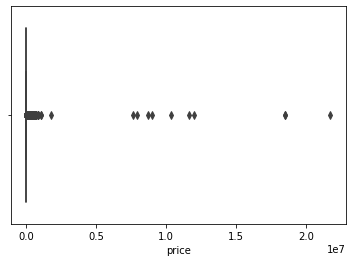

In [ ]:
sns.boxplot(x="price", data=pd_df)
plt.show()

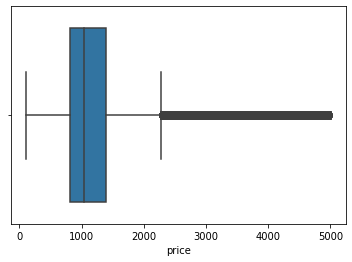

In [ ]:
pd_df=pd_df[pd_df["price"]>100]
pd_df=pd_df[pd_df["price"]<5000]
sns.boxplot(x="price", data=pd_df)

Idem pour la surface, nous choisissons seulement ce qui entre 150 et 4000 pieds carrés

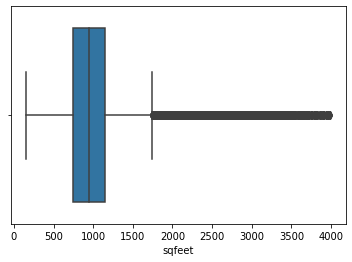

In [ ]:
pd_df=pd_df[pd_df["sqfeet"]>150]
pd_df=pd_df[pd_df["sqfeet"]<4000]
sns.boxplot(x="sqfeet", data=pd_df)
plt.show()

Nous avons maintenant une distribution assez centralisée pour "price" et "sqfeet"

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



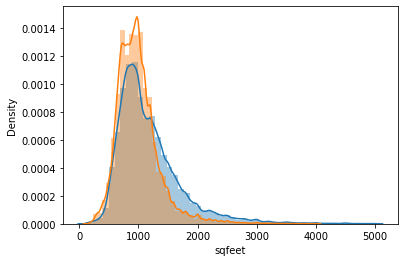

In [ ]:
sns.distplot(pd_df["price"])
sns.distplot(pd_df["sqfeet"])
plt.show()

Après étudier les valeurs pour "beds" et "baths", nous trouvons que les logements qui ont plus de 8 lits ou 7.5 salles de bains sont très rares, à éliminer

In [ ]:
pd_val_count=['beds', 'baths']
for i in pd_val_count:
    print(pd_df[i].value_counts())

2.0       173885
1.0       116043
3.0        66001
4.0        11195
0.0        10851
5.0         2110
6.0          177
7.0           26
8.0           19
1100.0         2
1000.0         1
Name: beds, dtype: int64
1.0     195957
2.0     133392
1.5      27168
2.5      12929
3.0       5266
0.0       3040
4.0       1361
3.5        898
4.5        173
5.0         69
5.5         41
6.0         12
75.0         2
7.5          1
25.0         1
Name: baths, dtype: int64


In [ ]:
pd_df=pd_df[pd_df["beds"]<=8]
pd_df=pd_df[pd_df["baths"]<7.5]

In [ ]:
new_data = spark.createDataFrame(pd_df)
new_data.count()

380306

In [ ]:
data.count() # nombre d'exemple total d'origine

384980

##### Encodage des données

Ici on supprime les colonnes pas utiles, comme region_url.

In [ ]:
new_data = new_data.withColumnRenamed("price","label")

In [ ]:
label = "label"
features_col = new_data.columns
features_col.remove(label)

# les champs utilisés
features_strcol = ["region","type","laundry_options","parking_options","state"]
features_numcol = ["sqfeet","beds","baths","cats_allowed","dogs_allowed","smoking_allowed","wheelchair_access","electric_vehicle_charge","comes_furnished","lat","long"]

In [ ]:
prefix = 'indexed_'
features_str_col = list(map(lambda c:prefix+c, features_strcol))
features_string_indexer = StringIndexer(inputCols=features_strcol, outputCols=features_str_col, handleInvalid='skip')
vec_assembler = VectorAssembler(inputCols=features_string_indexer.getOutputCols()+features_numcol, outputCol='vector', handleInvalid="skip")
vec_indexer = VectorIndexer(inputCol='vector', outputCol='features', maxCategories=400, handleInvalid='skip')

In [ ]:
# Transformation dans un seul pipeline
stages = [features_string_indexer, vec_assembler, vec_indexer]
pipeline = Pipeline(stages=stages)
train_data = pipeline.fit(new_data).transform(new_data)
train_data = train_data.select("features","label")
train_data.show()

+--------------------+------+
|            features| label|
+--------------------+------+
|(16,[0,3,5,6,7,8,...|1148.0|
|(16,[0,1,2,3,5,6,...|1200.0|
|[18.0,0.0,0.0,1.0...|1813.0|
|[18.0,0.0,0.0,2.0...|1095.0|
|[18.0,0.0,2.0,0.0...| 935.0|
|[18.0,0.0,0.0,2.0...|1095.0|
|(16,[0,3,5,6,7,8,...|1525.0|
|(16,[0,1,3,5,6,7,...|1295.0|
|(16,[0,1,2,3,5,6,...|2195.0|
|[18.0,0.0,0.0,2.0...|1159.0|
|(16,[0,5,6,7,8,9,...|1449.0|
|(16,[0,5,6,7,14,1...|1295.0|
|(16,[0,3,5,6,7,8,...| 982.0|
|(16,[0,3,5,6,7,8,...|1895.0|
|[18.0,4.0,1.0,3.0...|1495.0|
|(16,[0,1,3,5,6,7,...|1899.0|
|[18.0,0.0,2.0,0.0...|1075.0|
|(16,[0,3,5,6,7,10...|1495.0|
|[18.0,3.0,2.0,2.0...| 995.0|
|(16,[0,3,5,6,7,8,...|2295.0|
+--------------------+------+
only showing top 20 rows



##### train / test split

In [ ]:
# test sur le nodèle de régression model et l'évaluateur

#Séparer les données en 2 ensembles: train(70%) et test(30%)
(trainingData, testData) = train_data.randomSplit([0.7, 0.3])

# l'entraînement d'un modèle de l'arbre de décision simple
dt = DecisionTreeRegressor(maxBins=500)
model = dt.fit(trainingData)

# Utiliser le modèle pour prédire le loyer
predictions = model.transform(testData)

# afficher le résultat
predictions.select("prediction", "label", "features").show(20)

# calculer l'erreur : RWSE et MAE
evaluator1 = RegressionEvaluator(
    labelCol="label", predictionCol="prediction", metricName="rmse")
rmse = evaluator1.evaluate(predictions)
print("Root Mean Squared Error (RMSE) on test data = %g" % rmse)

evaluator2 = RegressionEvaluator(
    labelCol="label", predictionCol="prediction", metricName="mae")
mae = evaluator2.evaluate(predictions)
print("Mean Absolute Error (MAE) on test data = %g" % mae)

# imprimer le modèle
print(model)
# print(model.toDebugString)

+------------------+------+--------------------+
|        prediction| label|            features|
+------------------+------+--------------------+
| 887.6102038383598|1350.0|(16,[0,1,2,3,4,5,...|
|  2222.23436322532|1100.0|(16,[0,1,2,3,4,5,...|
|1839.4257425742574|1375.0|(16,[0,1,2,3,4,5,...|
|2535.1719209751996|3800.0|(16,[0,1,2,3,4,5,...|
|1839.4257425742574|1300.0|(16,[0,1,2,3,4,5,...|
|1797.9200497744596|2000.0|(16,[0,1,2,3,5,6,...|
| 2252.984107579462|1800.0|(16,[0,1,2,3,5,6,...|
|1797.9200497744596|1495.0|(16,[0,1,2,3,5,6,...|
|1240.5493784530386|1450.0|(16,[0,1,2,3,5,6,...|
|1240.5493784530386|1175.0|(16,[0,1,2,3,5,6,...|
|1240.5493784530386|1250.0|(16,[0,1,2,3,5,6,...|
|1592.4345854004252|1995.0|(16,[0,1,2,3,5,6,...|
|1592.4345854004252|1995.0|(16,[0,1,2,3,5,6,...|
|1592.4345854004252|1995.0|(16,[0,1,2,3,5,6,...|
|1592.4345854004252|1795.0|(16,[0,1,2,3,5,6,...|
|1592.4345854004252|1795.0|(16,[0,1,2,3,5,6,...|
|2246.0389261744967|1995.0|(16,[0,1,2,3,5,6,...|
|2246.0389261744967|

##### Cross Validation et Gridsearch

In [ ]:
dt = DecisionTreeRegressor()

dt_paramGrid = ParamGridBuilder()\
      .addGrid(dt.maxBins, [413,450,500,550])\
      .addGrid(dt.minInstancesPerNode, [100,200,300,400,500]) \
      .addGrid(dt.maxDepth, [5,10,15]) \
      .build()

evaluator1 = RegressionEvaluator(metricName="mae")

#create k folds with k=3.
cv_mae = CrossValidator(estimator=dt, collectSubModels=True,\
            estimatorParamMaps=dt_paramGrid, \
            evaluator=evaluator1, \
            numFolds=3, \
            parallelism=2)

In [ ]:
cvModel = cv_mae.fit(train_data)
bestModel_mae = cvModel.bestModel
print(bestModel_mae)

DecisionTreeRegressionModel: uid=DecisionTreeRegressor_76f5f62831ff, depth=15, numNodes=3219, numFeatures=16


In [ ]:
# Montrer les paramètres utilisés et la métrique MAE
params = [{p.name: v for p, v in m.items()} for m in cvModel.getEstimatorParamMaps()]

df_mae = pd.DataFrame.from_dict([
    {cvModel.getEvaluator().getMetricName(): metric, **ps} 
    for ps, metric in zip(params, cvModel.avgMetrics)
]).sort_values(by="mae", axis=0)

df_mae

,mae,maxBins,minInstancesPerNode,maxDepth
47,167.399311,550,100,15
2,167.406152,413,100,15
32,167.574271,500,100,15
17,167.606955,450,100,15
1,176.630621,413,100,10
46,176.769805,550,100,10
31,176.823614,500,100,10
16,176.983689,450,100,10
35,177.635411,500,200,15
20,177.663936,450,200,15


In [ ]:
evaluator2 = RegressionEvaluator(metricName="rmse")

cv_rmse = CrossValidator(estimator=dt, collectSubModels=True,\
            estimatorParamMaps=dt_paramGrid, \
            evaluator=evaluator2, \
            numFolds=3, \
            parallelism=2)

cvModel = cv_rmse.fit(train_data)
bestModel_rmse = cvModel.bestModel
print(bestModel_rmse)

params = [{p.name: v for p, v in m.items()} for m in cvModel.getEstimatorParamMaps()]

df_rmse = pd.DataFrame.from_dict([
    {cvModel.getEvaluator().getMetricName(): metric, **ps} 
    for ps, metric in zip(params, cvModel.avgMetrics)
]).sort_values(by="rmse", axis=0)

df_rmse

DecisionTreeRegressionModel: uid=DecisionTreeRegressor_76f5f62831ff, depth=15, numNodes=3211, numFeatures=16


,rmse,maxBins,minInstancesPerNode,maxDepth
2,284.828880,413,100,15
47,285.244783,550,100,15
17,285.375788,450,100,15
32,285.537538,500,100,15
1,290.231441,413,100,10
46,290.808470,550,100,10
16,290.958261,450,100,10
31,291.041113,500,100,10
20,295.197528,450,200,15
35,295.197906,500,200,15


Nous voyons bien qu'après avoir supprimé les valeurs extrêmes, le résultat de la régression devient beaucoup plus mieux : les métriques diminuent jusqu'à 165-220 pour MAE et 285-336 pour RMSE.

In [ ]:
# test on regression model and evaluator

# Split the data into training and test sets (30% held out for testing)
(trainingData, testData) = train_data.randomSplit([0.7, 0.3])

# Train a DecisionTree model.
dt = DecisionTreeRegressor(maxBins=500)  #, maxDepth=10
# Chain indexer and tree in a Pipeline
#pipeline = Pipeline(stages=[featureIndexer, dt])

# Train model.  This also runs the indexer.
model = dt.fit(trainingData)

# Make predictions.
predictions = model.transform(testData)

# Select example rows to display.
predictions.select("prediction", "label", "features").show(20)

# Select (prediction, true label) and compute test error
evaluator1 = RegressionEvaluator(
    labelCol="label", predictionCol="prediction", metricName="rmse")
rmse = evaluator1.evaluate(predictions)
print("Root Mean Squared Error (RMSE) on test data = %g" % rmse)

evaluator2 = RegressionEvaluator(
    labelCol="label", predictionCol="prediction", metricName="mae")
mae = evaluator2.evaluate(predictions)
print("Mean Absolute Error (MAE) on test data = %g" % mae)

# summary only
print(model)
# print(model.toDebugString)

+------------------+------+--------------------+
|        prediction| label|            features|
+------------------+------+--------------------+
| 892.1869559887214| 725.0|(16,[0,1,2,3,4,5,...|
| 1795.909433962264|2402.0|(16,[0,1,2,3,4,5,...|
| 1795.909433962264|1300.0|(16,[0,1,2,3,4,5,...|
|2186.1204318936875|2699.0|(16,[0,1,2,3,5,6,...|
|1237.1939775910364|1175.0|(16,[0,1,2,3,5,6,...|
|1600.8638200667722|1695.0|(16,[0,1,2,3,5,6,...|
|1600.8638200667722|1995.0|(16,[0,1,2,3,5,6,...|
|1600.8638200667722|1995.0|(16,[0,1,2,3,5,6,...|
|2061.8361581920904|1795.0|(16,[0,1,2,3,5,6,...|
|2061.8361581920904|1795.0|(16,[0,1,2,3,5,6,...|
|2061.8361581920904|1995.0|(16,[0,1,2,3,5,6,...|
| 892.1869559887214|1050.0|(16,[0,1,2,3,5,6,...|
| 892.1869559887214|1050.0|(16,[0,1,2,3,5,6,...|
|3223.5725190839694|2850.0|(16,[0,1,2,3,5,6,...|
|3223.5725190839694|2850.0|(16,[0,1,2,3,5,6,...|
|3223.5725190839694|4100.0|(16,[0,1,2,3,5,6,...|
|3223.5725190839694|4850.0|(16,[0,1,2,3,5,6,...|
| 1795.909433962264|

##### Visualisation

In [ ]:
#BEST MODEL MAE
dt = DecisionTreeRegressor(maxBins=550,minInstancesPerNode=100, maxDepth=15)
model = dt.fit(trainingData)
predictions = model.transform(testData)
predictions = predictions.select("prediction", "label")
pd = predictions.toPandas()
fig=px.scatter(pd, x="label", y="prediction")
fig.show()

In [ ]:
#BEST MODEL RMSE
dt = DecisionTreeRegressor(maxBins=413,minInstancesPerNode=100, maxDepth=15)
model = dt.fit(trainingData)
predictions = model.transform(testData)
predictions = predictions.select("prediction", "label")
pd = predictions.toPandas()
fig=px.scatter(pd, x="label", y="prediction")
fig.show()

<font color=red>Par rapport à la première itération,
c'est beaucoup mieux cette fois. Parce qu'on a modifié les
attributs non pertinents et supprimé les valeurs aberrantes.</font>

#### MAE ET RMSE

La 1 ere itération: RMSE 122214 et MAE 1786.85, RSME/MAE = 68<br> 
La 2 ere itération: RMSE 335.214 et MAE 221.779, RSME/MAE = 1.5<br>
En général, nous devrions nous attendre à ce que la valeur MAE soit beaucoup plus petite que la valeur RMSE. Parce que pour l'erreur quadratique moyenne RMSE, chaque erreur est au carré. Cela signifie qu'une seule erreur a une augmentation quadratique et a un effet différent sur la valeur RMSE finale.
<br>
Nous voyons que les **valeurs aberrantes** plus importantes ont un impact plus important sur l'erreur quadratique moyenne RMSE.




##Conclusion

1. On doit analyser les attributs de dataset. Parce qu'il y
a toujours valeurs aberrantes dans les attributs non pertinents.
<br>
2. Transformation des donnees à vecteur(features) et label.
<br>
3. Split train/test pour voir la performance.
<br>
4. Cross validation avec GridSearch pour trouver les meilleurs
parametres de Model. On utilise des métriques RMSE et MAE

##END